# Readme
To execute this notebook, you need the bare result files for the trained random forests. These are
* `results_classification_bare.csv` and
* `results_regression_bare.csv`


Due to their size, these files are not available in the github repository but can be retrieved from the following URL: [aas]

Then, they should be placed in the same directory of this notebook.

In [1]:
import matplotlib.pyplot as plt
import json
import numpy as np
import pandas as pd
from tqdm.notebook import tqdm
import tarfile

In [20]:
def plot_overview(df_results_bare):
    for openmlid, df_dataset in tqdm(df_results_bare.groupby("openmlid")):
        fig, axs = plt.subplots(1, 5, figsize=(20,3))
        for l in df_dataset["scores"].values:
            try:
                history = json.loads(l)
                
                times_train = [t[1] for t in history]
                times_dist = [t[2] for t in history]
                scores_oob= [t[3] for t in history]
                scores_val= [t[4] for t in history]
                
                ax = axs[0]
                ax.plot(range(len(scores_oob)), scores_oob)
                final_score = min(scores_oob)
                ax.set_ylim([final_score - 0.1, final_score + 0.1])
                ax.set_title(f"OOB scores on {openmlid}")
                
                ax = axs[1]
                ax.plot(range(len(scores_val)), scores_val)
                final_score = min(scores_val)
                ax.set_ylim([final_score - 0.1, final_score + 0.1])
                ax.set_title(f"Val scores on {openmlid}")

                ax = axs[2]
                ax.scatter(range(len(times_train)), times_train, s=5)
                ax.set_title(f"Time to train last tree (ms) on {openmlid}")
                
                ax = axs[3]
                ax.scatter(range(len(times_dist)), times_dist, s=5)
                ax.set_title(f"Time to compute distributions of last tree (ms) on {openmlid}")

                ax = axs[4]
                offset = 100
                memory = [t[5] / i for i, t in enumerate(history[offset - 1:], start=offset)]
                ax.step(range(len(memory)), memory)
                ax.set_title(f"Memory (MB) on {openmlid}")
                ax.set_ylim([0, max(memory) * 1.1])
                
                for ax in axs:
                    ax.set_xlabel("num trees")
            except:
                pass

        plt.show()

/home/felix/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:38: UserWarning: Attempting to set identical bottom == top == 0 results in singular transformations; automatically expanding.


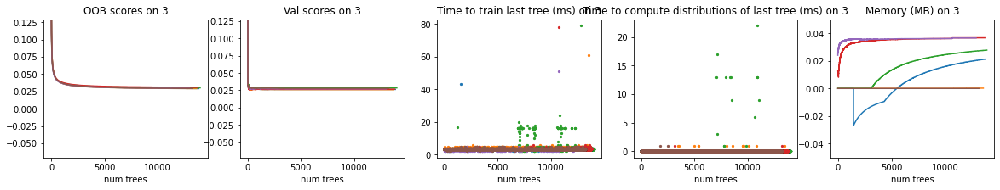

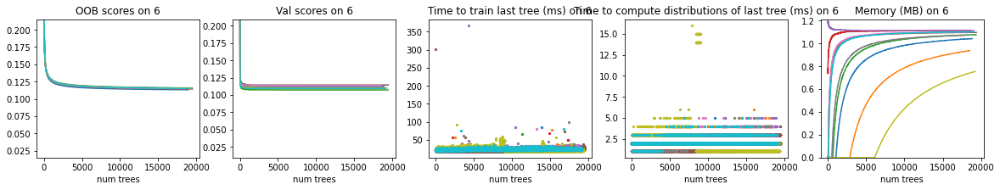

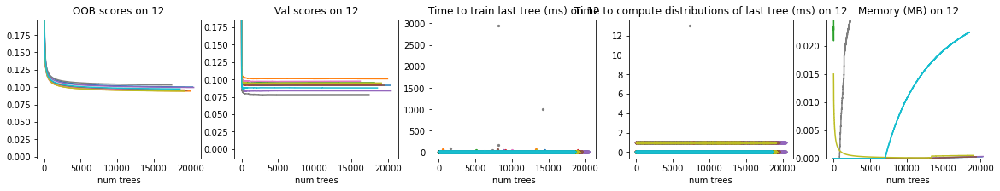

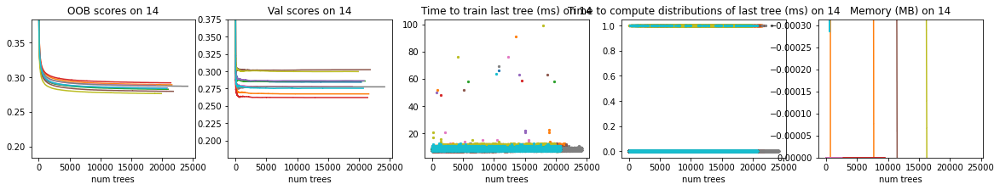

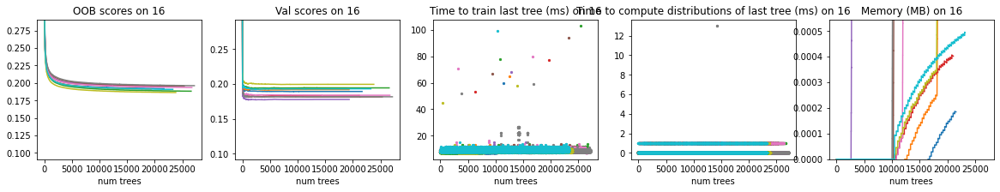

...

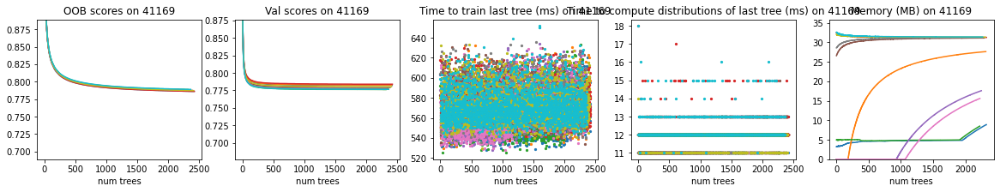

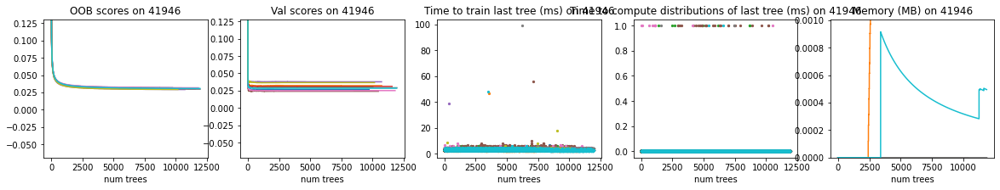

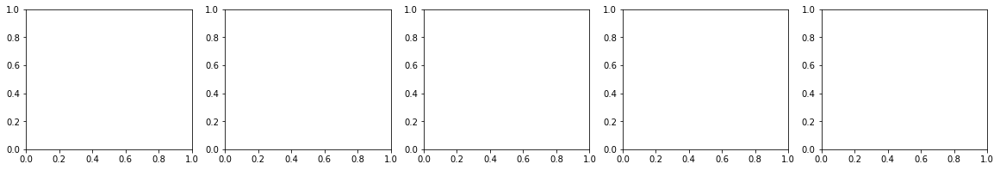

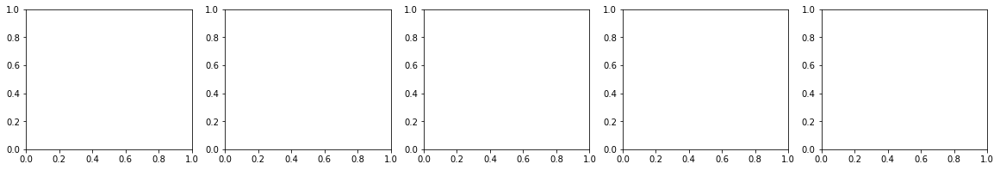

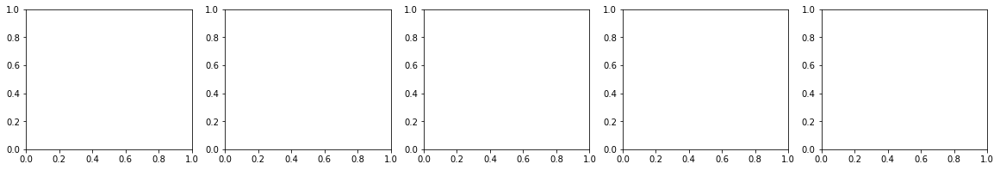

In [19]:
plot_overview(pd.read_csv("results_classification_bare.csv", sep=";"))

  0%|          | 0/55 [00:00<?, ?it/s]

/home/felix/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:38: UserWarning: Attempting to set identical bottom == top == 0 results in singular transformations; automatically expanding.


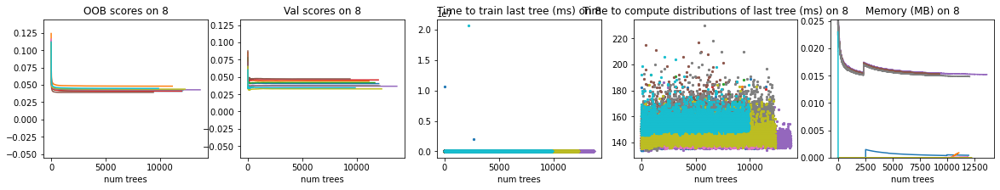

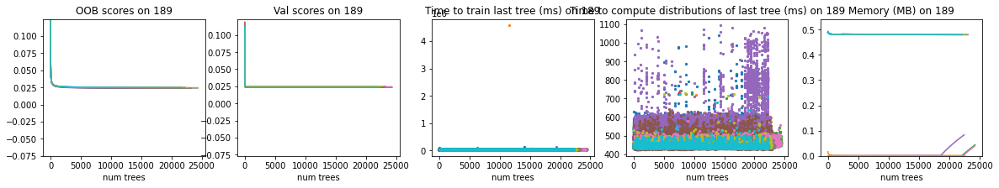

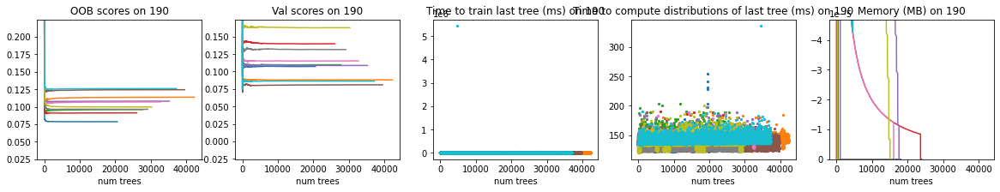

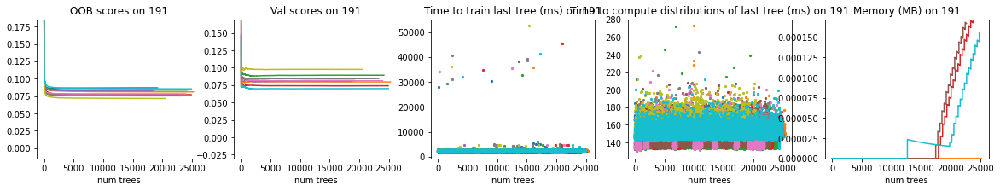

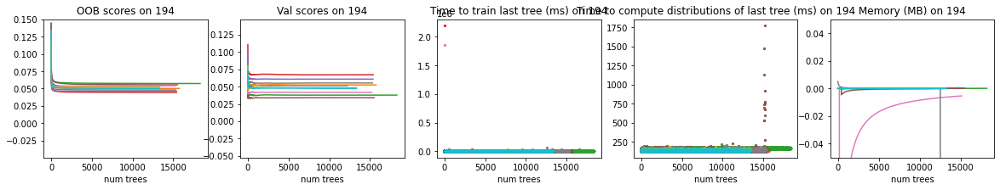

...

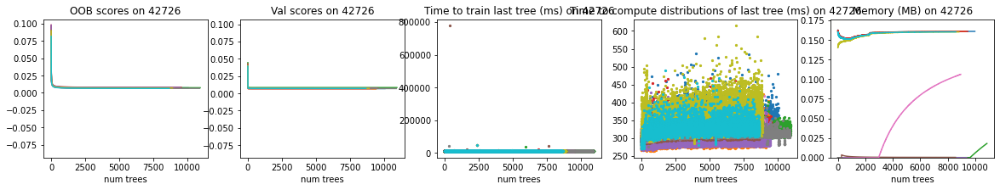

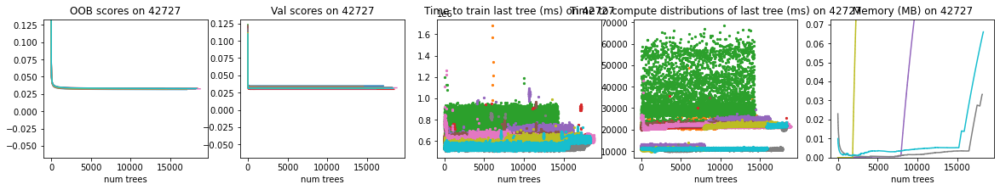

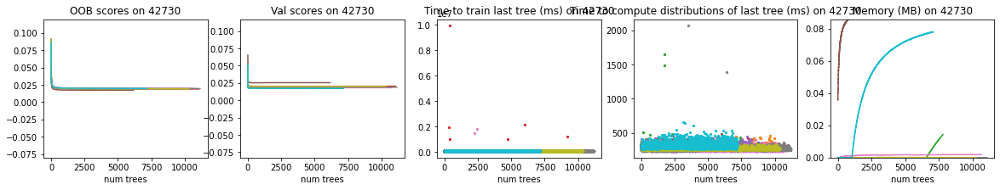

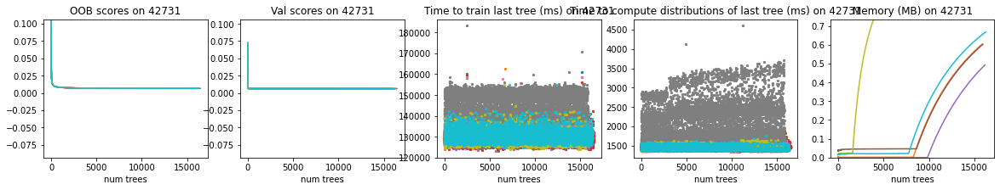

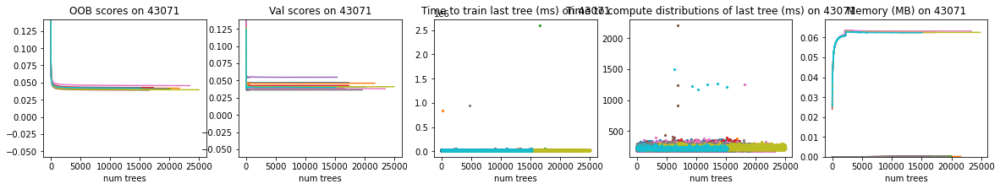

In [21]:
plot_overview(pd.read_csv("results_regression_bare.csv", sep=";"))

In [2]:
datasets_classification = list(pd.read_csv("../../../../lcdb/python/lcdb/datasets.csv")["openmlid"].values)

In [3]:
def prepare_result_dataset(df_results_bare):
    
    df_results = df_results_bare[df_results_bare["status"] == "done"]
    
    # decompose score field
    times_train = []
    times_dist = []
    scores_train = []
    scores_val = []
    memory = []
    for info in tqdm(df_results["scores"]):
        history = json.loads(info)
        times_train.append([t[1] for t in history])
        times_dist.append([t[2] for t in history])
        scores_train.append(list(np.round([t[3] for t in history], 6)))
        scores_val.append(list(np.round([t[4] for t in history], 6)))
        memory.append([t[-1] for t in history])
    
    # compute new result frame
    slopes = []
    for memory_hist in memory:
        cov = np.cov(range(1000), memory_hist[-1000:])
        slopes.append(np.round(cov[1,0] / cov[0,0], 6))
    return pd.DataFrame({
        "openmlid": df_results["openmlid"],
        "seed": df_results["seed"],
        "memory_per_tree": slopes,
        "train_time_per_tree_in_ms": [np.round(np.mean(e), 1) for e in times_train],
        "dist_time_per_tree_in_ms": [np.round(np.mean(e), 1) for e in times_dist],
        "scores_oob": scores_train,
        "scores_val": scores_val
    })
    
def plot_result_availability(df_results, expteded_datasets = None):
    
    if expteded_datasets is None:
        expteded_datasets = sorted(list(pd.unique(df_results["openmlid"])))
    
    # compute matrix of what we have available
    Z = np.zeros((len(expteded_datasets), 10))
    for i, openmlid in enumerate(expteded_datasets):
        m1 = df_results["openmlid"].astype(int) == openmlid
        for j in range(10):
            m2 = df_results["seed"].astype(int) == j
            Z[i,j] = np.count_nonzero(m1 & m2)
    
    # show availability
    fig, ax = plt.subplots(figsize=(10,len(expteded_datasets) * 0.4))
    ax.imshow(-Z, cmap="coolwarm")
    ax.set_yticks(range(len(expteded_datasets)))
    ax.set_yticklabels(expteded_datasets)
    ax.set_xticks(np.arange(-.5, 10, 1), minor=True)
    ax.set_yticks(np.arange(-.5, len(expteded_datasets), 1), minor=True)
    ax.grid(which='minor', color='w', linestyle='-', linewidth=2)
    plt.show()

Preparing results for classification.


  0%|          | 0/1943 [00:00<?, ?it/s]

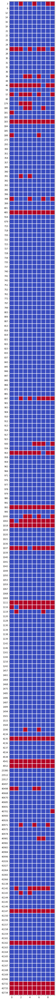

Results for classification ready, storing them in results_classification_base.csv.
Results for classification stored in results_classification_base.csv. Now creating the packed archive.
Packed archive ready.
Preparing results for regression.


  0%|          | 0/550 [00:00<?, ?it/s]

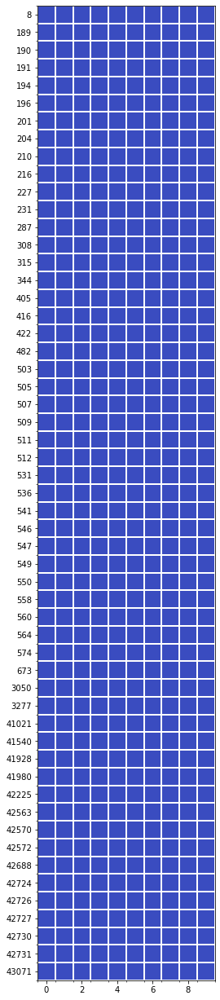

Results for regression ready, storing them in results_regression_base.csv.


In [ ]:
for key, expected_datasets in zip(["classification", "regression"], [datasets_classification, None]):
    print(f"Preparing results for {key}.")
    df_results = prepare_result_dataset(pd.read_csv(f"results_{key}_bare.csv", sep=";"))
    plot_result_availability(df_results, expected_datasets)
    file = f"results_{key}_base.csv"
    print(f"Results for {key} ready, storing them in {file}.")
    df_results.to_csv(file, index=False, sep=";")
    print(f"Results for {key} stored in {file}. Now creating the packed archive.")
    file = f"results_{key}_base.csv"
    with tarfile.open(f"{file}.tar.gz", "w:gz") as tar:
        tar.add(file, arcname=file)
    print("Packed archive ready.")